In [2]:
import keras.losses
import numpy as np
import matplotlib.pyplot as plt
import os
import math
import shutil
import glob

In [7]:
ROOT_DIR = "data"
os.listdir(ROOT_DIR)

['Moderately-differentiate',
 'Normal',
 'Poorly-differentiate',
 'Well-differentiate']

In [5]:
len(os.listdir(ROOT_DIR))

4

In [15]:
# count the number of images in each class
number_of_images = {}

for image_class in os.listdir(ROOT_DIR):
    number_of_images[image_class] = len(os.listdir(os.path.join(ROOT_DIR, image_class)))

number_of_images.items()

dict_items([('Moderately-differentiate', 249), ('Normal', 290), ('Poorly-differentiate', 288), ('Well-differentiate', 238)])

In [10]:
# Creating the train, validation and test folders
def dataFolder(p, split):
    if not os.path.exists("./"+p):
        os.mkdir("./"+p)

        for image_class in os.listdir(ROOT_DIR):
            os.makedirs("./"+p+"/"+image_class)
            for img in np.random.choice(a = os.listdir(os.path.join(ROOT_DIR,image_class)), #selecting images randomly
                                    size = (math.floor(split*number_of_images[image_class])-5), replace=False):
                O = os.path.join(ROOT_DIR, image_class, img) #path
                D = os.path.join("./"+p,image_class)
                shutil.copy(O,D)
                os.remove(O)
    else:
        print("the folder exist")

In [11]:
dataFolder("train", 0.7)

the folder exist


In [12]:
dataFolder("val", 0.15)

the folder exist


In [112]:
dataFolder("test", 0.15)

the folder exist


In [17]:
# count the number of images in each class
number_of_images = {}

for image_class in os.listdir('train'):
    number_of_images[image_class] = len(os.listdir(os.path.join('train', image_class)))

number_of_images.items()

dict_items([('Moderately-differentiate', 1046), ('Normal', 1086), ('Poorly-differentiate', 1076), ('Well-differentiate', 998)])

## Data Augmentation

In [20]:
from keras_preprocessing.image import ImageDataGenerator
from PIL import Image
import cv2

In [116]:
datagen = ImageDataGenerator(rotation_range=45, width_shift_range=0.2, height_shift_range=0.2,
                             shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='reflect')

In [119]:
def dataAugmentation(image_folder):
    dataset = []

    my_images = os.listdir(image_folder)
    for i, image_name in enumerate(my_images):
        image = cv2.imread(image_folder+image_name)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(image, 'RGB')
        image = image.resize((224,224))
        dataset.append(np.array(image))

    x = np.array(dataset)

    i = 0
    for batch in datagen.flow(x, batch_size=32, save_to_dir=image_folder,
                              save_prefix='aug', save_format='jpg', shuffle=True):
        i += 1
        if i > 30:
            break

In [120]:
dataAugmentation('train/Normal/')

In [121]:
dataAugmentation('train/Well-differentiate/')

In [122]:
dataAugmentation('train/Poorly-differentiate/')

In [124]:
dataAugmentation('train/Moderately-differentiate/')

# Model Building

In [126]:
from keras.layers import Conv2D, MaxPool2D, Dropout, Flatten, Dense, BatchNormalization, GlobalAvgPool2D
from keras.models import Sequential

In [127]:
# CNN model

model = Sequential()

model.add(Conv2D(filters=16, kernel_size=(3,3), activation='relu', input_shape=(224,224,3)))

model.add(Conv2D(filters=36, kernel_size=(3,3), activation='relu'))
model.add(MaxPool2D(pool_size=(2,2)))

model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
model.add(MaxPool2D(pool_size=(2,2)))

model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
model.add(MaxPool2D(pool_size=(2,2)))

model.add(Dropout(rate=0.25))

model.add(Flatten())
model.add(Dense(units=64, activation='relu'))
model.add(Dropout(rate=0.25))
model.add(Dense(units=4, activation='softmax'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 16)      448       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 36)      5220      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 36)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 64)      20800     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 52, 52, 128)       7

In [128]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

## Preparing the data

In [130]:
number_of_images = {}

for image_class in os.listdir('data'):
    number_of_images[image_class] = len(os.listdir(os.path.join('data', image_class)))

number_of_images.items()

dict_items([('Moderately-differentiate', 16), ('Normal', 16), ('Poorly-differentiate', 16), ('Well-differentiate', 17)])

In [22]:
train_datagen = ImageDataGenerator(zoom_range=0.2, shear_range=0.2, rescale=1/255, horizontal_flip=True)
train_images = train_datagen.flow_from_directory(directory='train', target_size=(224,224),
                                                 batch_size=32, class_mode='categorical')


Found 4206 images belonging to 4 classes.


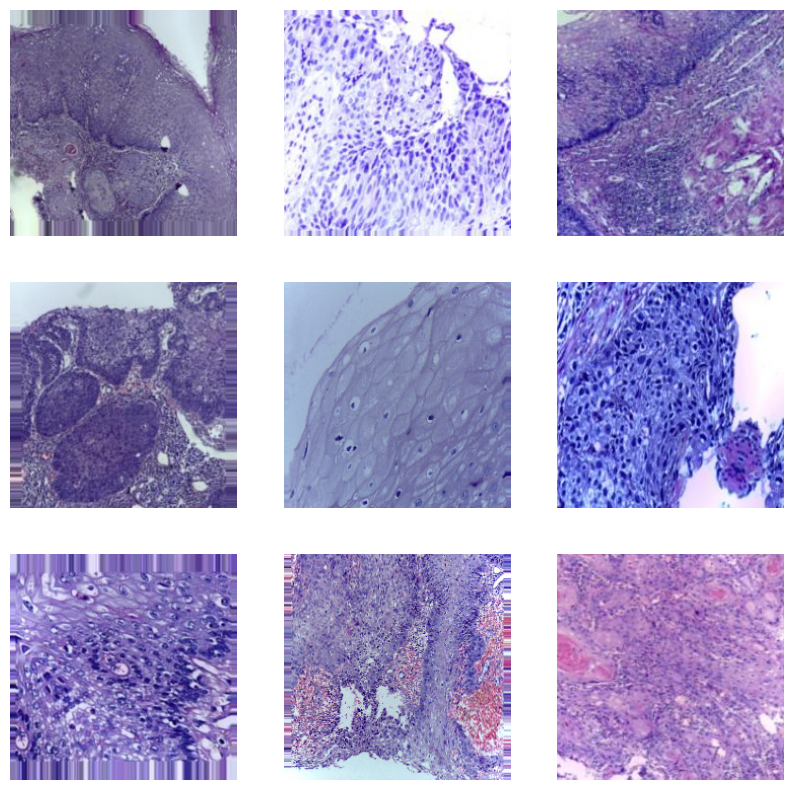

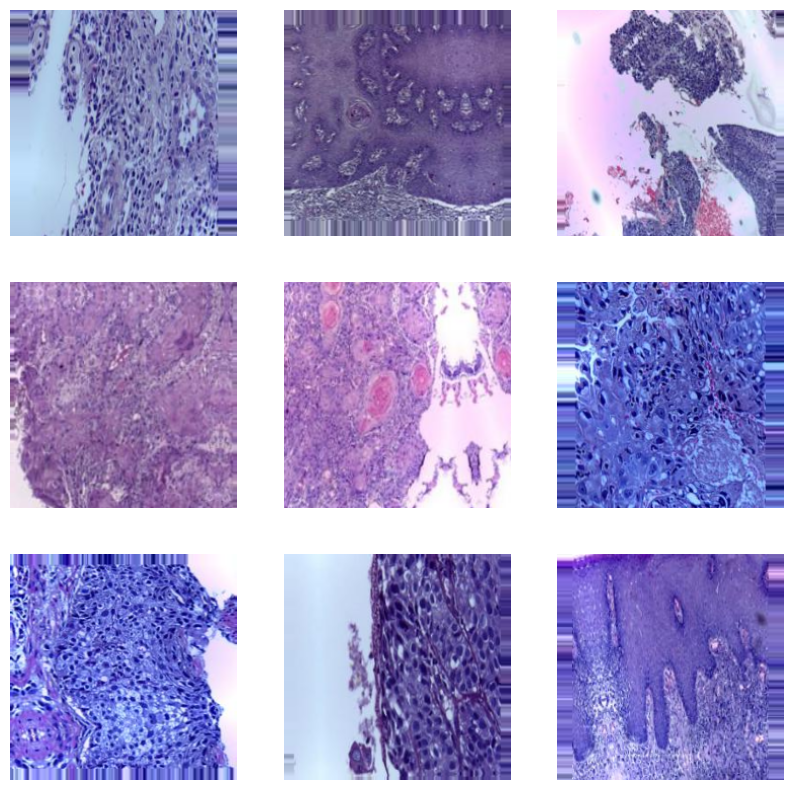

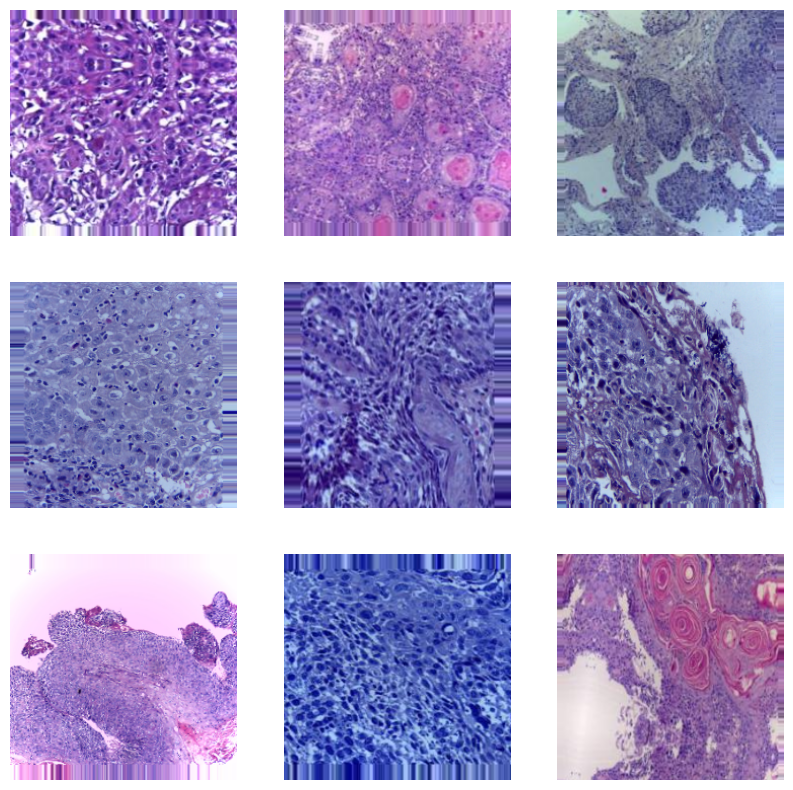

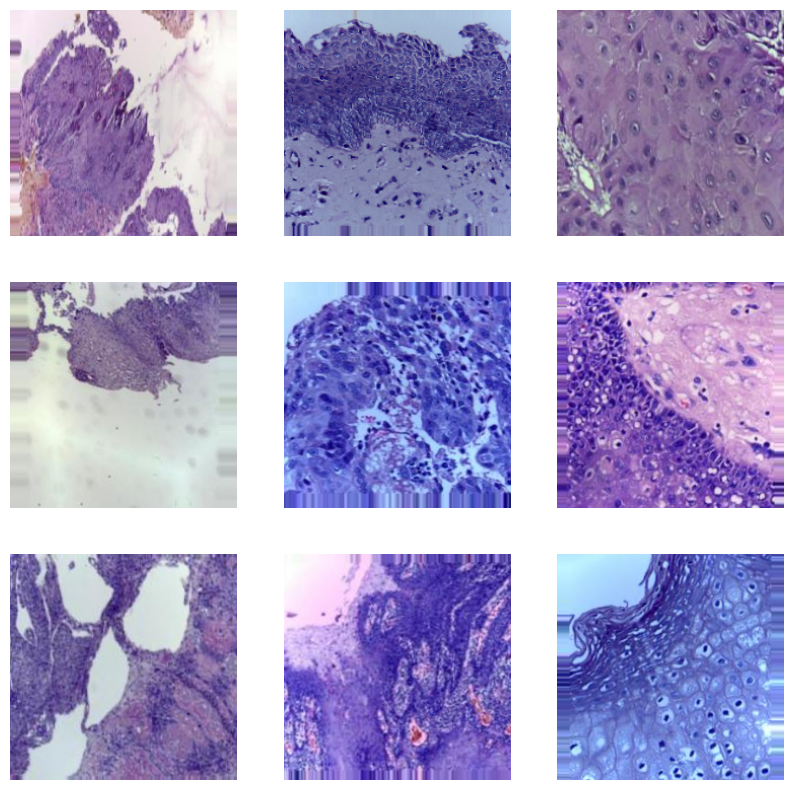

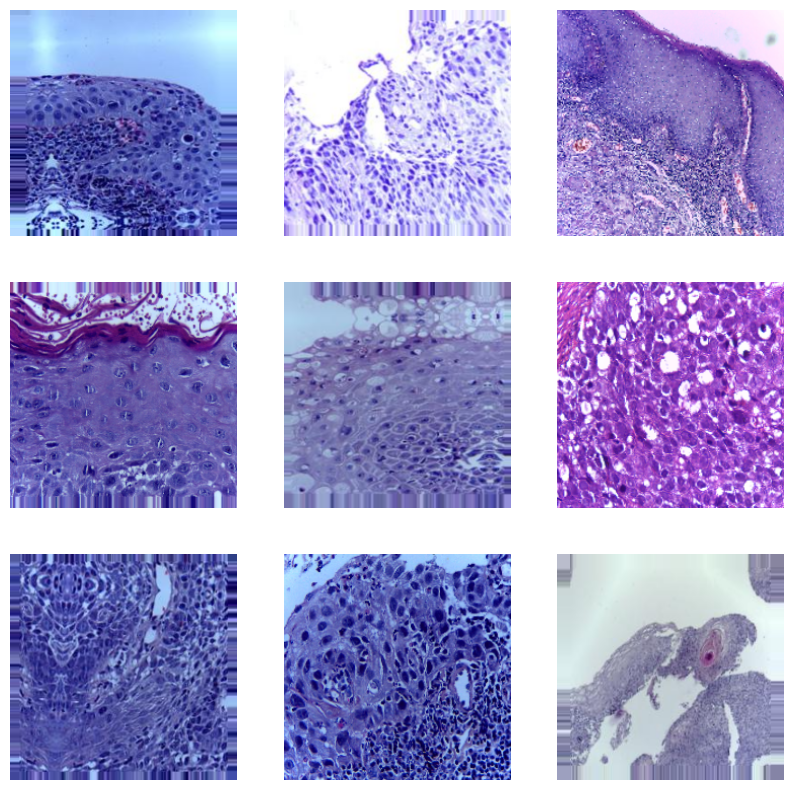

...

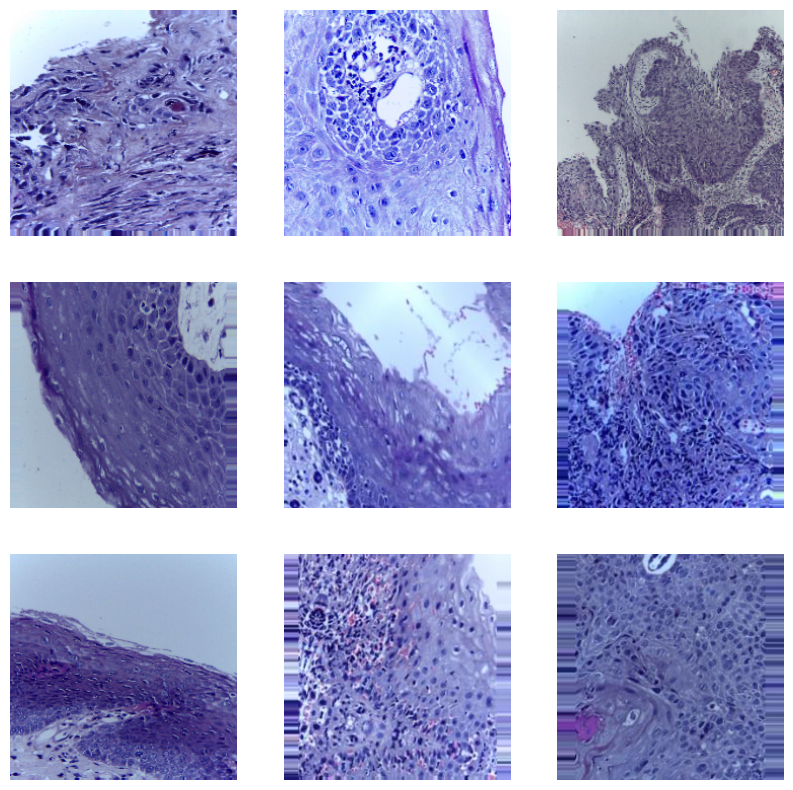

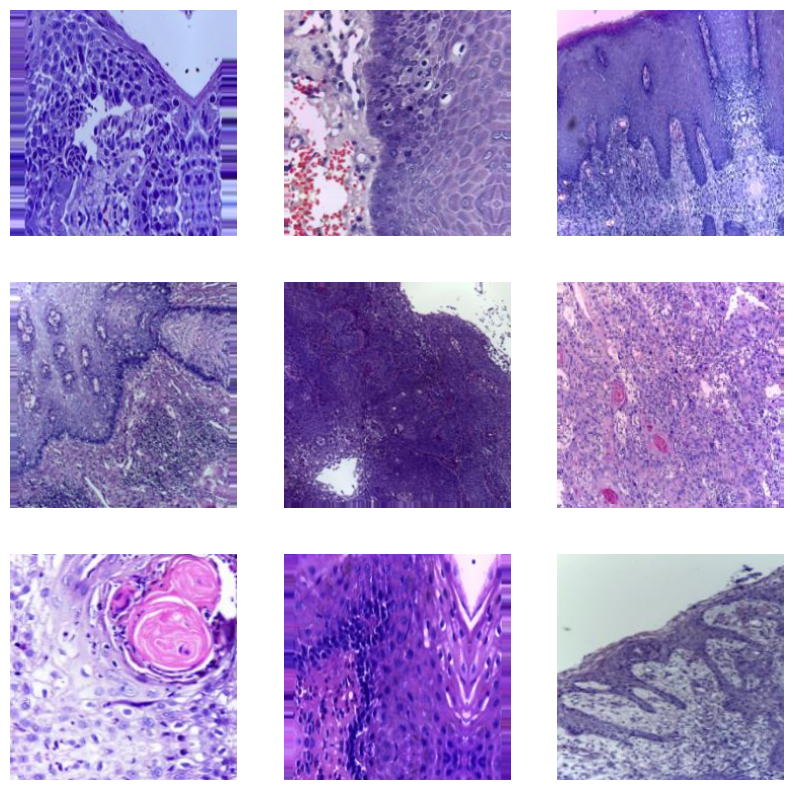

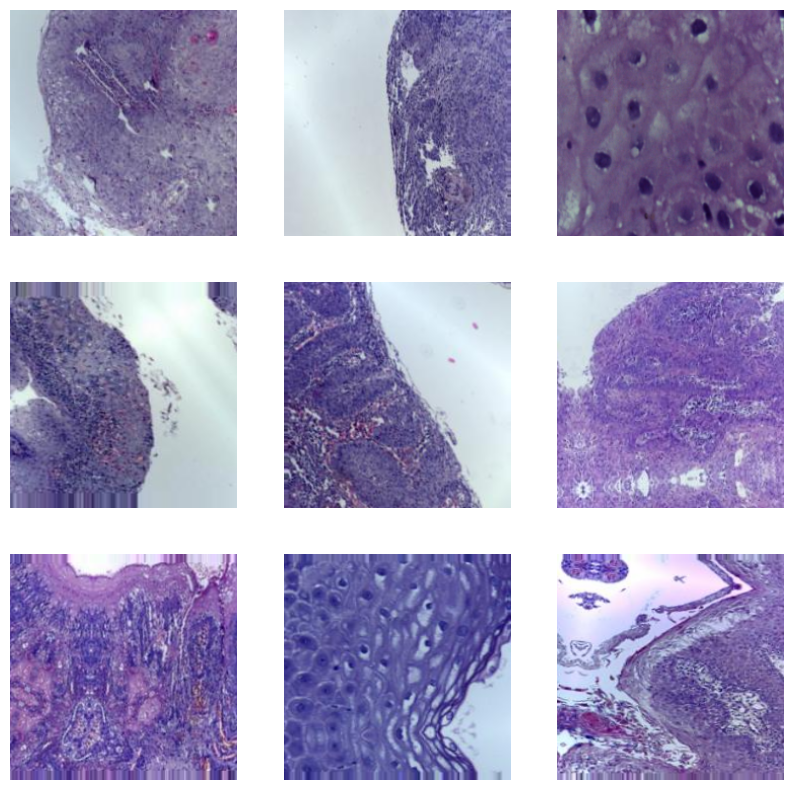

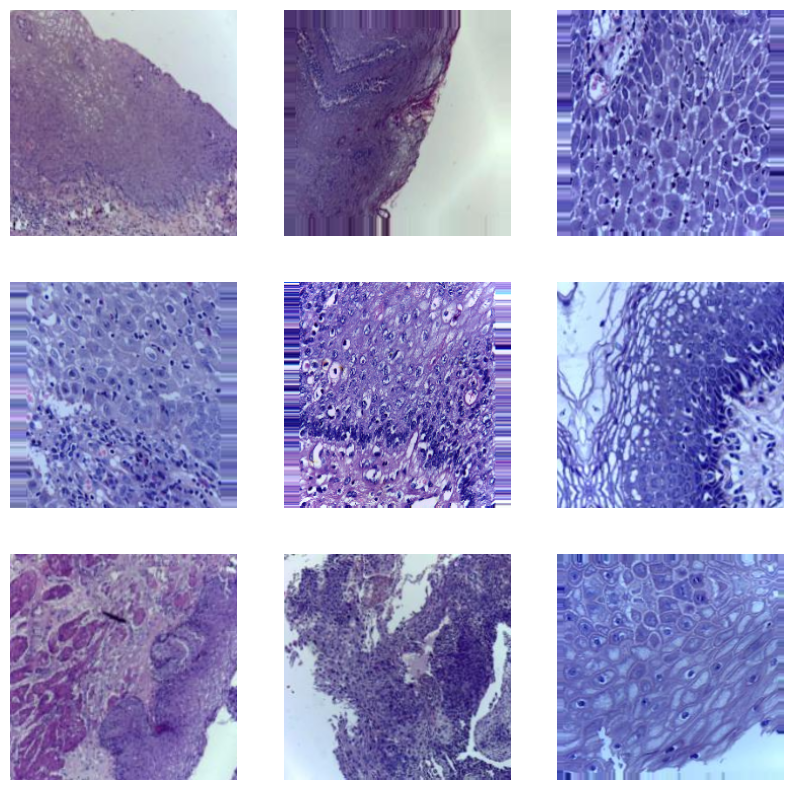

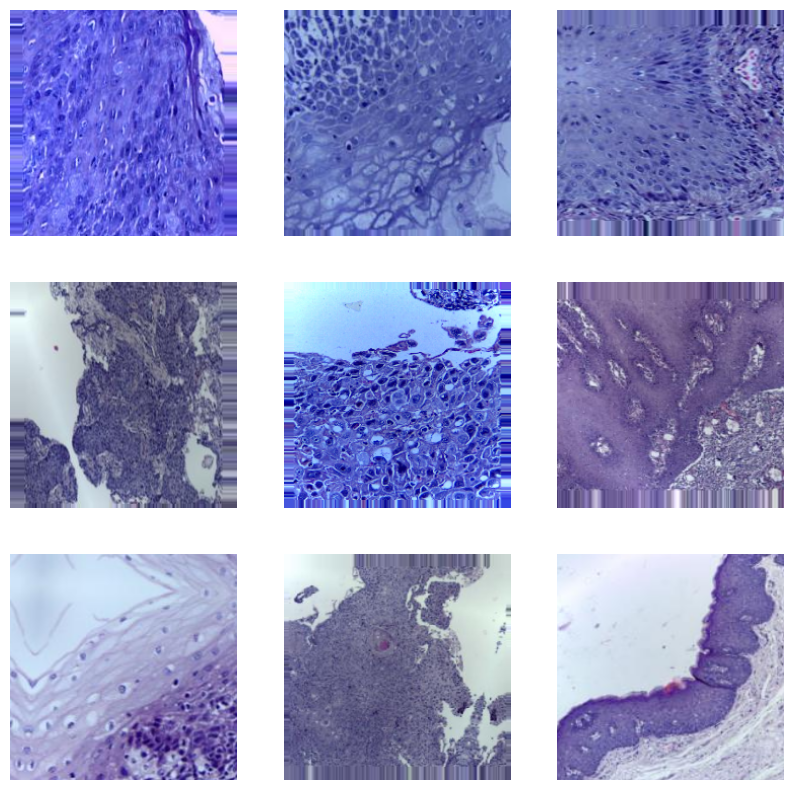

In [23]:
for i, (images, labels) in enumerate(train_images):
    plt.figure(figsize=(10,10))
    for j in range(9):
        plt.subplot(3,3,j+1)
        plt.imshow(images[j])
        plt.axis('off')
    plt.show()
    if i == 10:  # display only 10 batches of images
        break

In [132]:
validation_datagen = ImageDataGenerator(rescale=1/255)
validation_images = validation_datagen.flow_from_directory(directory='val', target_size=(224,224),
                                                 batch_size=32, class_mode='categorical')

Found 138 images belonging to 4 classes.


In [133]:
test_datagen = ImageDataGenerator(rescale=1/255)
test_images = test_datagen.flow_from_directory(directory='test', target_size=(224,224),
                                                 batch_size=32, class_mode='categorical')

Found 138 images belonging to 4 classes.


### Adding Early stopping and Model Checkpoint

In [134]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [154]:
# early stopping
es = EarlyStopping(monitor="val_accuracy", min_delta=0.01, patience=7, verbose=1, mode='auto')

# model checkpoint
mc = ModelCheckpoint(monitor="val_accuracy", filepath="./best_model_2.h5", save_best_only=True, verbose=1, mode='auto')

cd = [es,mc]

# Model Training

In [155]:
hs = model.fit(train_images,
                         epochs=20,
                         verbose=1,
                         validation_data=validation_images,
                         callbacks=cd)

Epoch 1/20
132/132 [==============================] - ETA: 0s - loss: 0.6558 - accuracy: 0.7225
Epoch 1: val_accuracy improved from -inf to 0.52899, saving model to .\best_model_2.h5
132/132 [==============================] - 288s 2s/step - loss: 0.6558 - accuracy: 0.7225 - val_loss: 1.3619 - val_accuracy: 0.5290
Epoch 2/20
132/132 [==============================] - ETA: 0s - loss: 0.6457 - accuracy: 0.7230
Epoch 2: val_accuracy did not improve from 0.52899
132/132 [==============================] - 283s 2s/step - loss: 0.6457 - accuracy: 0.7230 - val_loss: 1.4721 - val_accuracy: 0.5145
Epoch 3/20
132/132 [==============================] - ETA: 0s - loss: 0.6314 - accuracy: 0.7351
Epoch 3: val_accuracy improved from 0.52899 to 0.55797, saving model to .\best_model_2.h5
132/132 [==============================] - 283s 2s/step - loss: 0.6314 - accuracy: 0.7351 - val_loss: 1.3600 - val_accuracy: 0.5580
Epoch 4/20
132/132 [==============================] - ETA: 0s - loss: 0.6103 - accuracy:

In [156]:
h = hs.history
h.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

<function matplotlib.pyplot.show(close=None, block=None)>

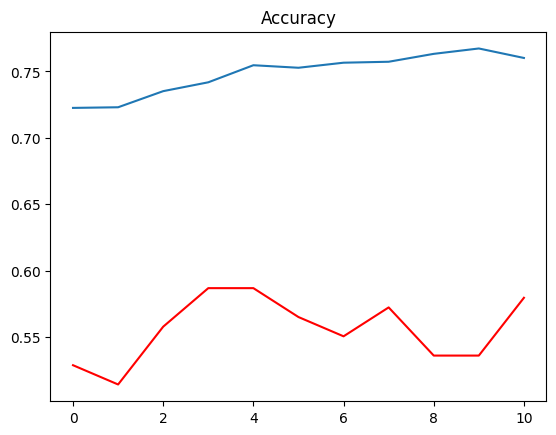

In [157]:
plt.plot(h['accuracy'])
plt.plot(h['val_accuracy'] ,c="red")
plt.title('Accuracy')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

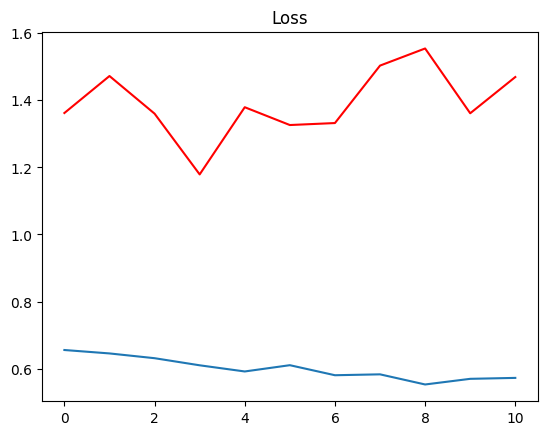

In [158]:
plt.plot(h['loss'])
plt.plot(h['val_loss'] ,c="red")
plt.title('Loss')
plt.show